# Analysis frequencies and phase

$$
\require{color}\notag%
$$

In the previous section, we saw how to setup comparisons between an input signal $x[n]$ and a collection of reference signals $y_m$ defined to be sinusoids (cosine waves) with analysis frequencies determined by the length $N$ of the signal (and the sampling rate $f_s$).

In this section, we'll dig a little deeper, and see how this kind of comparison behaves for specific choices of $x$.
This will both solidify our understanding of the process, and also illustrate some short-comings of the method that we'll need to improve.

In [1]:
%run ../setup.ipynb

## Comparing analysis frequencies

As a first step, let's see what happens when $x[n]$ is also a sinusoid at one of our chosen analysis frequencies.

For this example, we'll take $f_s = 20$, $N = 40$ (2 seconds), and take $x$ to be be the analysis frequency for $m=3$ ``[cycles / signal-duration]``.
Since the signal duration is 2 seconds, this corresponds to a frequency of $3/2$ ``[Hz]``.
Our sampled wave will be given by

```{math}

\color{#0271AE}{x[n]} = \cos\left(2\pi \cdot \frac{3}{40} \cdot n \right).
```

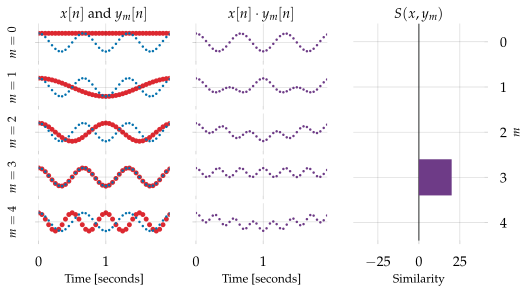

In [2]:
# Do the cosine transform
from matplotlib import gridspec

fig = plt.figure(figsize=figaspect(0.5))

M = 5

gs = gridspec.GridSpec(M, 3)

fs = 20
N = 40
t = np.arange(N) / fs
f0 = 1.5
x = np.cos(2 * np.pi * f0 * t)

xfft = np.fft.rfft(x).real

sharing = None
for i in range(M):
    ax1 = plt.subplot(gs[i, 0], sharex=sharing, sharey=sharing)
    
    ref = np.cos(2 * np.pi * i / N * fs * t)

    ax1.plot(t, x, zorder=2, marker='.', markersize=5, linestyle='')
    ax1.plot(t, ref, zorder=-1, marker='.', markersize=10, linestyle='')
    ax1.set_ylim([-2.05, 2.05])
    ax1.set_yticks([0])
    ax1.set_yticklabels([])
    ax1.set_ylabel('$m={:d}$'.format(i))
    ax1.label_outer();

    xsim = x * ref
    
    ax2 = plt.subplot(gs[i, 1], sharex=sharing, sharey=sharing)
    ax2.plot(t, xsim, color=colors[4], label=r'$x[n] \cdot y_m[n]$', marker='.', markersize=5, linestyle='')
    ax2.set_yticks([0])
    ax2.set_ylim([-2.1, 2.1])
    ax2.label_outer();
    
    if i == 0:
        ax1.set_title('$x[n]$ and $y_m[n]$')
        ax2.set_title(r'$x[n] \cdot y_m[n]$')
    elif i == M - 1:
        ax1.set_xlabel('Time [seconds]')
        ax2.set_xlabel('Time [seconds]')
        
ax = plt.subplot(gs[:, 2])
ax.barh(np.arange(M), xfft[:M], color=colors[4])
ax.invert_yaxis();
ax.axvline(0, color=colors[3], zorder=-1, linewidth=1)
ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
ax.set(title=r'$S(x, y_m)$', ylabel=r'$m$', yticks=range(M), xlim=[-N, N], ylim=[M - 1 + .4, -0.4], xlabel='Similarity');
glue('analysis-example', fig, display=False)

```{glue:figure} analysis-example
---
name: analysis-example
---

Comparing a sinusoid $x[n]$ at an analysis frequency to each reference signal.
```

{numref}`analysis-example` shows the similarity comparisons and resulting scores for the first five reference signals.
In this case, all scores are 0 except for $m=3$, which corresponds exactly to the frequency of our test signal $x[n]$.

*Why does this happen?*

### Understanding analysis frequencies

Our definitions of similarity (eq. {eq}`similarity`) reference signal (eq. {eq}`reference-signal`) give us the following:

```{math}
:label: compare-analysis

\begin{align*}
S({\color{#0271AE} x}, {\color{#DC2830} y_m}) &= \sum_{n=0}^{N-1} \color{#0271AE}{x[n]} \cdot \color{#DC2830}{y_m[n]} \\
&= \sum_{n=0}^{N-1} \color{#0271AE}{\cos\left(2\pi \cdot \frac{3}{N} \cdot n \right)} \cdot \color{#DC2830}{\cos\left(2\pi \cdot \frac{m}{N} \cdot n \right)}
\end{align*}
```

The **product-to-sum** rule for cosines gives us for any angles $\theta$ and $\phi$:

```{math}
\cos(\theta) \cdot \cos(\phi) = \frac{1}{2}\left(\cos(\theta + \phi) + \cos(\theta - \phi)\right)
```

If for each sample index $n$, we let 

$$\theta = 2\pi \cdot \frac{3}{N} \cdot n$$ 

be the angle of the first factor in the summation (the $x$ part), and let

$$\phi = 2\pi \cdot \frac{m}{N} \cdot n$$ 

be the angle of the second factor (the $y$ part), we would get

```{math}
\begin{align*}
\theta + \phi &= 2\pi \cdot \frac{3 + m}{N} \cdot n\\
\theta - \phi &= 2\pi \cdot \frac{3 - m}{N} \cdot n,
\end{align*}
```

and each term of the summation in {eq}`compare-analysis` can be rewritten as:

```{math}

\begin{align*}
\color{#0271AE}{\cos\left(2\pi \cdot \frac{3}{N} \cdot n \right)} \cdot \color{#DC2830}{\cos\left(2\pi \cdot \frac{m}{N} \cdot n \right)}
&=\frac{1}{2} \cdot \left( \cos \left(2\pi \cdot \frac{3+ m}{N} \cdot n \right) + \cos\left(2\pi \cdot \frac{3-m}{N}\cdot n \right) \right)\\
&= \frac{1}{2} \left(  \color{#DC2830}{y_{3+m}[n]} +  \color{#DC2830}{y_{3-m}[n]} \right).
\end{align*}
```

This tells us that in this case, $S$ can be computed by averaging the samples of reference signals $y_{3+m}$ and $y_{3-m}$.

```{margin}
More generally, if $x$ was the $k$'th analysis frequency, we would have $y_{k+m}$ and $y_{k-m}$.
```

Plugging this back into Equation {eq}`compare-analysis`, we get

```{math}

\begin{align*}
S({\color{#0271AE} x}, {\color{#DC2830} y_m}) &= \sum_{n=0}^{N-1} \frac{1}{2} \left(  \color{#DC2830}{y_{3+m}[n]} +  \color{#DC2830}{y_{3-m}[n]} \right)\\
&= \frac{1}{2} \left(\sum_{n=0}^{N-1} \color{#DC2830}{y_{3+m}[n]} \right) +
\frac{1}{2} \left(\sum_{n=0}^{N-1} \color{#DC2830}{y_{3-m}[n]} \right)\\
\end{align*}
```

where the second step follows by breaking the summation into pieces only concerned with $y_{3+m}$ or $y_{3-m}$.

Now, let's consider two cases.  If $m \neq 3$, then both of these signals will have non-zero frequency.
Because they are both analysis frequencies, they will complete a whole number of cycles in the duration of the signal.
This means that when we sum the sample values, they will {ref}`average to zero <averaging-waves>`!
Since both summations will total to zero, the full similarity score $S(x, y_m) = 0$.

On the other hand, if $m = 3$, then our two signals will be $y_{3+3}=y_{6}$ and $y_{3-3} = y_0$.
The first signal $y_6$ will total to zero by the argument above.
The second signal, $y_0$ however will *not* total to zero, because $y_0[n] = 1$ for all $n$.
As a result, 

```{math}

S({\color{#0271AE} x}, {\color{#DC2830} y_3}) = \frac{1}{2}\sum_{n=0}^{N-1} y_0[n] = \frac{1}{2} \cdot N.
```

There is a third case that can happen (but not in the example above), where $x$ is generated by either the highest anaylsis frequency $k=N/2$ (the Nyquist frequency) or if $k=0$ (constant signal).
If this happens, and $m=k$, then

```{math}

\begin{align*}
y_{k+m} = y_{2\cdot N/2} = y_N &= y_0 & \text{if }k = m = \frac{N}{2}\\
y_{k+m} = y_{0+0} &= y_0 & \text{if } k = m = 0.
\end{align*}
```

In either event, both terms in the summation become $N/2$ and the total score is $N$.

This explains the observation above: similarity between analysis frequencies is either $0$, $\frac{N}{2}$, or $N$, and the latter cases only occur when the reference signal $y_m$ has the same frequency as the input $x$.


```{warning}

This cancellation **only** happens if $x$ is a wave at an analysis frequency.

Waves at non-analysis frequencies will not generally share this property.
```

## Non-analysis frequencies

If instead of an analysis frequency, we had chosen $x$ to be a sinusoid at a frequency that **does not** complete a whole number of cycles over the signal duration, we could still try to apply the reasoning above, but it's not going to work out.

For example, if we take $m = 1.5$ ``[cycles / signal-duration]`` --- which is not an analysis frequency because 1.5 is not an integer --- we would have a wave $x[n]$ at $1.5/2 = 3/4$ ``[Hz]``:

```{math}

\color{#0271AE}{x[n]} = \cos\left(2\pi \cdot \frac{1.5}{40} \cdot n \right).
```


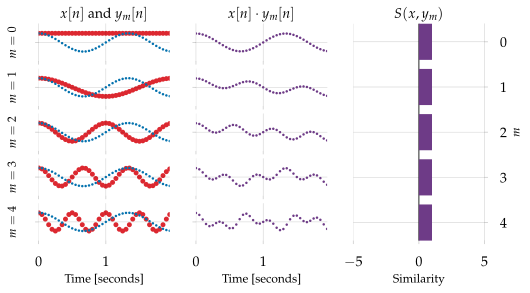

In [3]:
# Do the cosine transform
from matplotlib import gridspec

fig = plt.figure(figsize=figaspect(0.5))

M = 5

gs = gridspec.GridSpec(M, 3)

fs = 20
N = 40
t = np.arange(N) / fs
f0 = 0.75
x = np.cos(2 * np.pi * f0 * t)

xfft = np.fft.rfft(x).real

sharing = None
for i in range(M):
    ax1 = plt.subplot(gs[i, 0], sharex=sharing, sharey=sharing)
    
    ref = np.cos(2 * np.pi * i / N * fs * t)

    ax1.plot(t, x, zorder=2, marker='.', markersize=5, linestyle='')
    ax1.plot(t, ref, zorder=-1, marker='.', markersize=10, linestyle='')
    ax1.set_ylim([-2.05, 2.05])
    ax1.set_yticks([0])
    ax1.set_yticklabels([])
    ax1.set_ylabel('$m={:d}$'.format(i))
    ax1.label_outer();

    xsim = x * ref
    
    ax2 = plt.subplot(gs[i, 1], sharex=sharing, sharey=sharing)
    ax2.plot(t, xsim, color=colors[4], label=r'$x[n] \cdot y_m[n]$', marker='.', markersize=5, linestyle='')
    ax2.set_yticks([0])
    ax2.set_ylim([-2.1, 2.1])
    ax2.label_outer();
    
    if i == 0:
        ax1.set_title('$x[n]$ and $y_m[n]$')
        ax2.set_title(r'$x[n] \cdot y_m[n]$')
    elif i == M - 1:
        ax1.set_xlabel('Time [seconds]')
        ax2.set_xlabel('Time [seconds]')
        
ax = plt.subplot(gs[:, 2])
ax.barh(np.arange(M), xfft[:M], color=colors[4])
ax.invert_yaxis();
ax.axvline(0, color=colors[3], zorder=-1, linewidth=1)
ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
ax.set(title=r'$S(x, y_m)$', ylabel=r'$m$', yticks=range(M), xlim=[-5, 5], ylim=[M - 1 + .4, -0.4], xlabel='Similarity');
glue('non-analysis-example', fig, display=False)

```{glue:figure} non-analysis-example
---
name: non-analysis-example
---

Comparing a sinusoid $x[n]$ at a non-analysis frequency to each reference signal results in non-zero similarities $S$.
```

Like before, {numref}`non-analysis-example` shows the similarity comparisons and resulting scores for the first five reference signals.
In this case, the scores are all non-zero because the wave doesn't precisely line up with itself at $N$ samples.

This phenomenon is known as **spectral leakage**: a wave at a non-analysis frequency will *leak* across the entire frequency range, and appear to be a little similar to each analysis frequency.

We'll have more to say about this in subsequent chapters, but for now, it's important to understand that waves of different frequencies can still produce a non-zero similarity score.

## Phase

The examples we've seen so far have all used cosine waves, but what if we had used a sine wave instead for our signal $x$?

Let's return to the first example, using $m=3$ to generate a sine wave at an analysis frequency:

```{math}

\color{#0271AE}{x[n]} = \sin\left(2\pi \cdot \frac{3}{40} \cdot n \right).
```

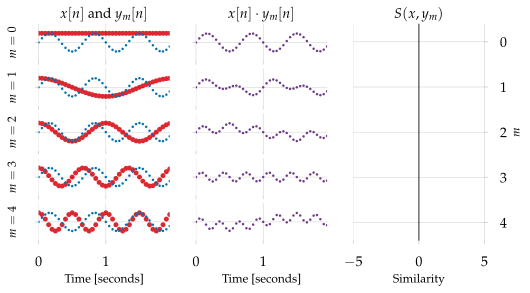

In [4]:
# Do the cosine transform
from matplotlib import gridspec

fig = plt.figure(figsize=figaspect(0.5))

M = 5

gs = gridspec.GridSpec(M, 3)

fs = 20
N = 40
t = np.arange(N) / fs
f0 = 1.5
x = np.sin(2 * np.pi * f0 * t)

xfft = np.fft.rfft(x).real

sharing = None
for i in range(M):
    ax1 = plt.subplot(gs[i, 0], sharex=sharing, sharey=sharing)
    
    ref = np.cos(2 * np.pi * i / N * fs * t)

    ax1.plot(t, x, zorder=2, marker='.', markersize=5, linestyle='')
    ax1.plot(t, ref, zorder=-1, marker='.', markersize=10, linestyle='')
    ax1.set_ylim([-2.05, 2.05])
    ax1.set_yticks([0])
    ax1.set_yticklabels([])
    ax1.set_ylabel('$m={:d}$'.format(i))
    ax1.label_outer();

    xsim = x * ref
    
    ax2 = plt.subplot(gs[i, 1], sharex=sharing, sharey=sharing)
    ax2.plot(t, xsim, color=colors[4], label=r'$x[n] \cdot y_m[n]$', marker='.', markersize=5, linestyle='')
    ax2.set_yticks([0])
    ax2.set_ylim([-2.1, 2.1])
    ax2.label_outer();
    
    if i == 0:
        ax1.set_title('$x[n]$ and $y_m[n]$')
        ax2.set_title(r'$x[n] \cdot y_m[n]$')
    elif i == M - 1:
        ax1.set_xlabel('Time [seconds]')
        ax2.set_xlabel('Time [seconds]')
        
ax = plt.subplot(gs[:, 2])
ax.barh(np.arange(M), xfft[:M], color=colors[4])
ax.invert_yaxis();
ax.axvline(0, color=colors[3], zorder=-1, linewidth=1)
ax.yaxis.tick_right()
ax.yaxis.set_label_position('right')
ax.set(title=r'$S(x, y_m)$', ylabel=r'$m$', yticks=range(M), xlim=[-5, 5], ylim=[M - 1 + .4, -0.4], xlabel='Similarity');
glue('sine-analysis-example', fig, display=False)

```{glue:figure} sine-analysis-example
---
name: sine-analysis-example
---

A sine wave $x[n]$ at an analysis frequency results in similarities $S=0$ for all reference signals!
```

{numref}`sine-analysis-example` is not an error --- all similarity scores here are 0, **including** the comparison to $m=3$!

To make sense of this, we'll first convert the $\sin$ wave into a standard cosine form by using Equation {eq}`wave-convert`:

```{math}

\begin{align*}
x[n] &= \sin\left(2\pi \cdot \frac{3}{N} \cdot n\right) & \text{by definition of } x\\
&= \cos\left(\frac{\pi}{2} - 2\pi \cdot \frac{3}{N} \cdot n\right) & \text{by the conversion rule}\\
&= \cos\left(2\pi \cdot \frac{3}{N} \cdot n - \frac{\pi}{2}\right) & \cos(\theta) = \cos(-\theta).
\end{align*}
```

Now that we have $x$ in cosine form, we can apply the reasoning from above to calculate each similarity score:

```{math}

\begin{align*}
S(x, y_m) &= \sum_{n=0}^{N-1} {\color{#0271AE} \cos\left(2\pi \cdot \frac{3}{N} \cdot n - \frac{\pi}{2}\right)} \cdot 
{\color{#DC2830} \cos \left(2\pi\cdot\frac{m}{N} \cdot n \right)}\\
&= \frac{1}{2} \sum_{n=0}^{N-1} \left( {\color{#0271AE} \cos\left(2\pi \cdot \frac{3 + m}{N} \cdot n - \frac{\pi}{2}\right)} + 
{\color{#DC2830} \cos \left(2\pi\cdot\frac{3-m}{N} \cdot n - \frac{\pi}{2}\right)} \right)
\end{align*}
```

This looks almost identical to our first example, except that we now have phase offsets of $-\pi/2$ in both terms of the summation.
If $m \neq 3$, this phase difference will not matter: summing over all samples $n=0\dots N-1$ will still produce a total of 0.

However, if $m=3$, the first term (${\color{#0271AE}3+m}$) will again cancel to 0 when summed, but the second term (${\color{#DC2830}3-m=0}$) will simplify to

```{math}

{\color{#DC2830} \cos\left(2\pi \cdot \frac{0}{N}\cdot n - \frac{\pi}{2} \right)} 
= \cos\left(-\frac{\pi}{2} \right)
= \cos\left(\frac{\pi}{2} \right) = 0. 
```

So, rather than getting a contribution of $\cos(0) = 1$ for each term in the summation like our first example, we instead get a contribution of 0, and the total summation results in $S=0$.

**This is a huge problem!**

Remember that our goal is to represent the frequency content of a signal $x$ by comparing it against a collection of reference signals of known frequencies.
But what we've just shown is that a signal can have exactly the same frequency as one of our reference signals, **and still produce a score of 0!**

This example of a sine wave is in some ways the worst-case scenario.
In a bit more generality, we can consider a signal $x$ with an analysis frequency index $m \neq 0$ and arbitrary phase offset $\phi$:

```{math}
x[n] = \cos\left(2\pi \cdot \frac{m}{N} \cdot n + \phi\right)
```

and by substituting $\phi$ for $-\pi/2$ in the above derivation, we generally have

```{math}
:label: phase-similarity

S(x, y_m) = 
\begin{cases}
\frac{N}{2} \cdot \cos\phi &\text{if } m \neq  \frac{N}{2}\\
N \cdot \cos\phi & \text{if } m = \frac{N}{2}.
\end{cases}
```

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


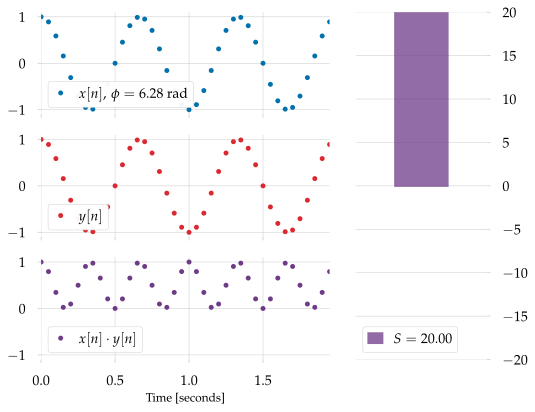

In [5]:
from matplotlib import gridspec

fs = 20
N = 40
t = np.arange(N) / fs
f0 = 1.5
x = np.cos(2 * np.pi * f0 * t)

# Time sample positions
y = np.cos(2 * np.pi * f0 * t)

# filter coefficients
xy = x * y

pxsum = np.cumsum(xy)

# Set up the plot skeleton
fig = plt.figure(figsize=figaspect(4./5))

legs = []

gs = gridspec.GridSpec(3, 3)

ax1 = plt.subplot(gs[0:1, 0:2])
# This is the input data
p_x = ax1.plot(t, x, label=r'$x[n],\, \phi=0$', linestyle='', marker='.',
                       markersize=10, zorder=2)[0]

legs.append(ax1.legend(ncol=2, loc='lower left'))
ax1.label_outer()

ax2 = plt.subplot(gs[1:2, 0:2], sharex=ax1, sharey=ax1)

p_y = ax2.plot(t, y, label=r'$y[n]$', linestyle='', marker='.', color=colors[1],
                       markersize=10, zorder=2)[0]

# And a label that will change

ax2.legend(ncol=2, loc='lower left')
ax2.label_outer()


ax3 = plt.subplot(gs[2:3, 0:2], sharex=ax1, sharey=ax1)

p_xy = ax3.plot(t, xy, linestyle='', marker='.', label=r'$x[n] \cdot y[n]$',
                   markersize=10, color=colors[4], zorder=1)[0]

k = 0

ax3.set_xlabel('Time [seconds]')
ax3.label_outer()
ax3.legend(loc='lower left')
ax3.set_ylim([-1.1, 1.1])

ax4 = plt.subplot(gs[:, 2])
p_S = ax4.bar(np.arange(1), [0], color=colors[4], label='$S$', alpha=0.75,
                linewidth=2, edgecolor=colors[4])
ax4.xaxis.set(ticks=[])
ax4.yaxis.tick_right()
ax4.set_ylim([-N//2, N//2])
ax4.set_xlim([-1, 1])

legs.append(ax4.legend(loc='lower left'))

##--
## Animation code
# Animation frame rate
frame_rate = 24
anim_speed = 4

n_frames = int(30 * frame_rate / anim_speed)

phi = np.linspace(0, 2 * np.pi, num=n_frames)

def init():
    return tuple([p_x, p_xy] + legs + list(p_S))
        
# This is all badly broken
def animate(n):
    x = np.cos(2 * np.pi * f0 * t + phi[n])
    p_x.set_data(t, x)
    p_xy.set_data(t, x * y)
    score = x.dot(y)
    for _, b in enumerate(p_S):
        b.set_height(score)

    p_x.set_label('$x[n],\,\\phi={:.02f}$ rad'.format(phi[n]))
    legs[0].texts[0].set_text(p_x.get_label())
    p_S.set_label('$S={:.02f}$'.format(score))
    legs[1].texts[0].set_text(p_S.get_label())
    return tuple([p_x, p_xy] + legs + list(p_S))

animation = FuncAnimation(fig, animate, init_func=init,
                               frames=np.arange(n_frames),
                               interval=1000./frame_rate, blit=True,
                               repeat_delay=1000);

glue('wave-similarity', animation, display=False)

In [6]:
animation

```{glue:figure} wave-similarity

$x$ (top) is a sinusoid of the same analysis frequency as the reference signal $y$ (middle), but with varying phase $\phi$.
As $\phi$ varies, the sample-wise product changes (bottom), as does the total score $S$ (right).
```

## Summary

In this section, we've seen a few interesting quirks of the frequency representation developed in the previous section.
To quickly recap:

1. If $x$ is **cosine wave** at an analysis frequency, it will have non-zero similarity only for reference signal of the same frequency.
2. If $x$ is a cosine wave at a **non-analysis** frequency, it will have non-zero similarity to all reference signals.
3. If $x$ is a **sine wave** at an analysis frequency, it will have zero similarity even the reference signal of the same frequency.
4. If $x$ is a sinusoid of arbitrary phase at an analysis frequency, its similarity scores will generally depend on its phase.

In the next section, we'll see how to resolve the phase issue to provide a more robust representation: *the Fourier transform*!